In [1]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "training_linear_models"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

# Ignore useless warnings (see SciPy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")

In [4]:
X = 2 * np.random.rand(100, 1)
y = 4 + 4 * X + np.random.randn(100, 1)

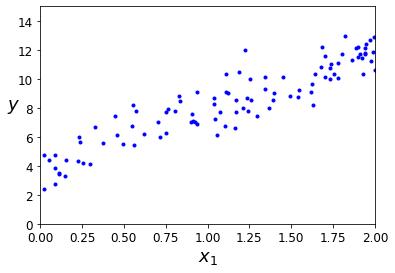

In [9]:
plt.plot(X, y, 'b.')
plt.xlabel("$x_1$", fontsize=18)
plt.ylabel("$y$", rotation=0, fontsize=18)
plt.axis([0,2, 0, 15])
plt.show()

In [10]:
X.shape

(100, 1)

In [13]:
X_b = np.c_[np.ones((100, 1)), X]
theta_best = np.linalg.inv(X_b.T.dot(X_b)).dot(X_b.T).dot(y)

In [15]:
X_b.shape


(100, 2)

In [16]:
X_new = np.array([[0],[2]])
X_new_b = np.c_[np.ones((2,1)), X_new]
y_predict = X_new_b.dot(theta_best)
y_predict

array([[ 3.9202609],
       [11.8422225]])

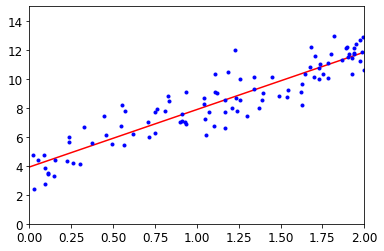

In [17]:
plt.plot(X_new, y_predict, "r-")
plt.plot(X, y, "b.")
plt.axis([0, 2, 0, 15])
plt.show()

In [18]:
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(X, y)

lin_reg.intercept_, lin_reg.coef_

(array([3.9202609]), array([[3.9609808]]))

In [20]:
lin_reg.predict(X_new)

array([[ 3.9202609],
       [11.8422225]])

#Linear regression using batch gradient descent.

In [21]:
eta = 0.1
n_iterations = 1000
m = 100

theta = np.random.randn(2, 1)
theta

array([[-0.76325916],
       [-1.8048821 ]])

In [22]:
for iteration in range(n_iterations):
    gradients = 2/m * X_b.T.dot(X_b.dot(theta) - y)
    theta = theta - eta * gradients

In [23]:
theta

array([[3.9202609],
       [3.9609808]])

In [29]:
X_new_c = np.c_[np.ones((2,1)), X_new]
X_new_c

array([[1., 0.],
       [1., 2.]])

In [30]:
X_new

array([[0],
       [2]])

In [35]:
X_b.shape

(100, 2)

In [36]:
len(X_b)

100

In [34]:
X_new_c.dot(theta)

array([[ 3.9202609],
       [11.8422225]])

In [33]:
theta_path_bgd = []

def plot_gradient_descent(theta, eta, theta_path=None):
    m = len(X_b)
    plt.plot(X, y, 'b.')
    n_iterations = 1000
    
    for i in range(n_iterations):
        if iteration < 10:
            y_predict = X_new_b.dot(theta)
            style = "b-" if iteration > 0 else "r--"
            plt.plot(X_new, y_predict, style)
            
        gradients = 2/m * X_b.T.dot(X_b.dot(theta) - y)
        theta -= eta * gradients
        if theta_path is not None:
            theta_path.append(theta)
            
    plt.xlabel("$x_1$", fontsize=18)
    plt.axis([0, 2, 0, 15])
    plt.title(r"$\eta = {}$".format(eta), fontsize=16)

Saving figure gradient_descent_plot


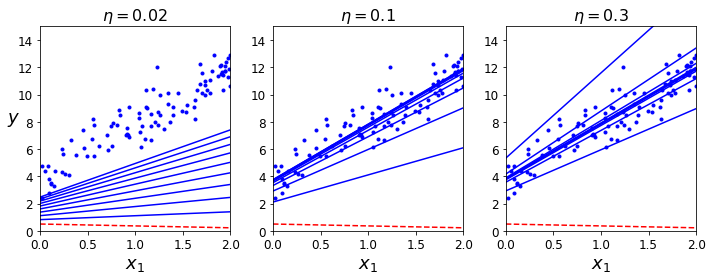

In [38]:
np.random.seed(42)
theta = np.random.randn(2,1)  # random initialization

plt.figure(figsize=(10,4))
plt.subplot(131); plot_gradient_descent(theta, eta=0.02)
plt.ylabel("$y$", rotation=0, fontsize=18)
plt.subplot(132); plot_gradient_descent(theta, eta=0.1, theta_path=theta_path_bgd)
plt.subplot(133); plot_gradient_descent(theta, eta=0.3)

save_fig("gradient_descent_plot")
plt.show()

In [43]:

theta_path_sgd = []
m = len(X_b)
np.random.seed(42)

X.shape, y.shape, X_b.shape

xi = X_b[i]
yi = y[i]

xi.shape, yi.shape



((2,), (1,))

In [46]:
X_b[1:1+1]

array([[1.        , 0.93732128]])

Saving figure sgd_plot


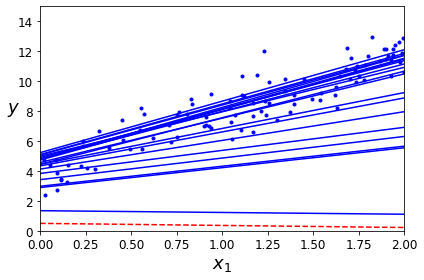

In [47]:
n_epochs = 50
t0, t1 = 5, 50  # learning schedule hyperparameters

def learning_schedule(t):
    return t0 / (t + t1)

theta = np.random.randn(2,1)  # random initialization

for epoch in range(n_epochs):
    for i in range(m-1):
        if epoch == 0 and i < 20:                    # not shown in the book
            y_predict = X_new_b.dot(theta)           # not shown
            style = "b-" if i > 0 else "r--"         # not shown
            plt.plot(X_new, y_predict, style)        # not shown
            
        xi = X_b[i:i+1]
        yi = y[i:i+1]
        gradients = 2 * xi.T.dot(xi.dot(theta) - yi)
        eta = learning_schedule(epoch * m + i)
        theta = theta - eta * gradients

plt.plot(X, y, "b.")                                 # not shown
plt.xlabel("$x_1$", fontsize=18)                     # not shown
plt.ylabel("$y$", rotation=0, fontsize=18)           # not shown
plt.axis([0, 2, 0, 15])                              # not shown
save_fig("sgd_plot")                                 # not shown
plt.show()                                           # not shown


Mini-Batch

In [50]:
theta_path_mgd = []

n_iterations = 50
minibatch_size = 20

np.random.seed(42)
theta = np.random.randn(2,1)  # random initialization

t0, t1 = 200, 1000
def learning_schedule(t):
    return t0 / (t + t1)

t = 0
for epoch in range(n_iterations):
    rand_idx = np.random.permutation(m)
    X_random = X_b[rand_idx]
    y_random = y[rand_idx]
    
    for i in range(0, m, minibatch_size):
        xi = X_random[i: i+minibatch_size]
        yi = y_random[i: i+minibatch_size]
        
        gradients = 2/minibatch_size * xi.T.dot(xi.dot(theta) - yi)
        eta = learning_schedule(t)
        
        theta -= eta * gradients
        theta_path_mgd.append(theta)

In [51]:
theta


array([[3.95776284],
       [4.05815691]])

In [57]:

theta_path_bgd = np.array(theta_path_bgd)
theta_path_sgd = np.array(theta_path_sgd)
theta_path_mgd = np.array(theta_path_mgd)

theta_path_sgd.shape
theta_path_mgd.shape


(250, 2, 1)

Text(0, 0.5, '$\\theta_1$   ')

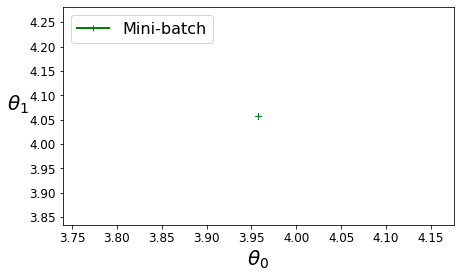

In [56]:

plt.figure(figsize=(7,4))
plt.plot(theta_path_mgd[:, 0], theta_path_mgd[:, 1], "g-+", linewidth=2, label="Mini-batch")
#plt.plot(theta_path_bgd[:, 0], theta_path_bgd[:, 1], "b-o", linewidth=3, label="Batch")
plt.legend(loc="upper left", fontsize=16)
plt.xlabel(r"$\theta_0$", fontsize=20)
plt.ylabel(r"$\theta_1$   ", fontsize=20, rotation=0)

In [58]:
X_new=np.linspace(-3, 3, 100).reshape(100, 1)
X_new[:5]

array([[-3.        ],
       [-2.93939394],
       [-2.87878788],
       [-2.81818182],
       [-2.75757576]])

# Regularize Models

In [59]:

np.random.seed(42)
m = 20
X = 3 * np.random.rand(m, 1)
y = 1 + 0.5 * X + np.random.randn(m, 1) / 1.5
X_new = np.linspace(0, 3, 100).reshape(100, 1)

In [60]:
from sklearn.linear_model import Ridge
ridge_reg = Ridge(alpha=1, solver="cholesky", random_state=42)
ridge_reg.fit(X, y)
ridge_reg.predict([[1.5]])

array([[1.55071465]])

In [61]:

ridge_reg = Ridge(alpha=1, solver="sag", random_state=42)
ridge_reg.fit(X, y)
ridge_reg.predict([[1.5]])

array([[1.5507201]])

Saving figure ridge_regression_plot


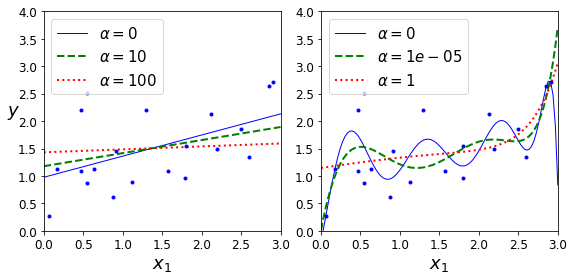

In [65]:
from sklearn.linear_model import Ridge
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler


def plot_model(model_class, polynomial, alphas, **model_kargs):
    for alpha, style in zip(alphas, ("b-", "g--", "r:")):
        model = model_class(alpha, **model_kargs) if alpha > 0 else LinearRegression()
        if polynomial:
            model = Pipeline([
                    ("poly_features", PolynomialFeatures(degree=10, include_bias=False)),
                    ("std_scaler", StandardScaler()),
                    ("regul_reg", model),
                ])
        model.fit(X, y)
        y_new_regul = model.predict(X_new)
        lw = 2 if alpha > 0 else 1
        plt.plot(X_new, y_new_regul, style, linewidth=lw, label=r"$\alpha = {}$".format(alpha))
    plt.plot(X, y, "b.", linewidth=3)
    plt.legend(loc="upper left", fontsize=15)
    plt.xlabel("$x_1$", fontsize=18)
    plt.axis([0, 3, 0, 4])

plt.figure(figsize=(8,4))
plt.subplot(121)
plot_model(Ridge, polynomial=False, alphas=(0, 10, 100), random_state=42)
plt.ylabel("$y$", rotation=0, fontsize=18)
plt.subplot(122)
plot_model(Ridge, polynomial=True, alphas=(0, 10**-5, 1), random_state=42)

save_fig("ridge_regression_plot")
plt.show()

# Logistic Regression

Saving figure logistic_function_plot


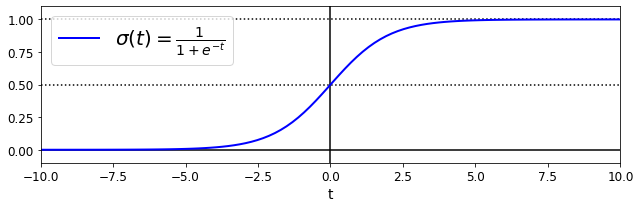

In [77]:
t = np.linspace(-10, 10, 100)
sig = 1 / (1 + np.exp(-t))
plt.figure(figsize=(9, 3))
plt.plot([-10, 10], [0, 0], "k-")
plt.plot([-10, 10], [0.5, 0.5], "k:")
plt.plot([-10, 10], [1, 1], "k:")
plt.plot([0, 0], [-1, 1.5], "k-")
plt.plot(t, sig, "b-", linewidth=2, label=r"$\sigma(t) = \frac{1}{1 + e^{-t}}$")
plt.xlabel("t")
plt.legend(loc="upper left", fontsize=20)
plt.axis([-10, 10, -0.1, 1.1])
save_fig("logistic_function_plot")
plt.show()

In [78]:
from sklearn import datasets
iris = datasets.load_iris()
list(iris.keys())

['data', 'target', 'target_names', 'DESCR', 'feature_names', 'filename']

In [79]:
print(iris.DESCR)


.. _iris_dataset:

Iris plants dataset
--------------------

**Data Set Characteristics:**

    :Number of Instances: 150 (50 in each of three classes)
    :Number of Attributes: 4 numeric, predictive attributes and the class
    :Attribute Information:
        - sepal length in cm
        - sepal width in cm
        - petal length in cm
        - petal width in cm
        - class:
                - Iris-Setosa
                - Iris-Versicolour
                - Iris-Virginica
                
    :Summary Statistics:

    ============== ==== ==== ======= ===== ====================
                    Min  Max   Mean    SD   Class Correlation
    ============== ==== ==== ======= ===== ====================
    sepal length:   4.3  7.9   5.84   0.83    0.7826
    sepal width:    2.0  4.4   3.05   0.43   -0.4194
    petal length:   1.0  6.9   3.76   1.76    0.9490  (high!)
    petal width:    0.1  2.5   1.20   0.76    0.9565  (high!)
    ============== ==== ==== ======= ===== ===========

In [80]:
X = iris["data"][:, 3:]  # petal width
y = (iris["target"] == 2).astype(np.int)  # 1 if Iris virginica, else 0

In [81]:
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression(solver="lbfgs", random_state=42)
log_reg.fit(X, y)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

[[0.        ]
 [0.003003  ]
 [0.00600601]
 [0.00900901]]
[[9.99250016e-01 7.49984089e-04]
 [9.99240201e-01 7.59799387e-04]
 [9.99230257e-01 7.69743043e-04]
 [9.99220183e-01 7.79816732e-04]]
(1000, 1)
(1000, 2)


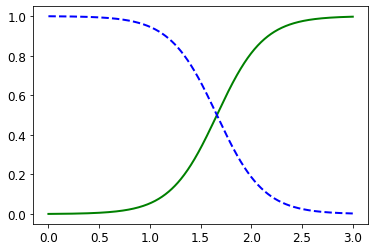

In [84]:
X_new = np.linspace(0, 3, 1000).reshape(-1, 1)
y_proba = log_reg.predict_proba(X_new)

print(X_new[:4])
print(y_proba[:4])
print(X_new.shape)
print(y_proba.shape)

plt.plot(X_new, y_proba[:, 1], "g-", linewidth=2, label="Iris virginica")
plt.plot(X_new, y_proba[:, 0], "b--", linewidth=2, label="Not Iris virginica")

Saving figure logistic_regression_plot


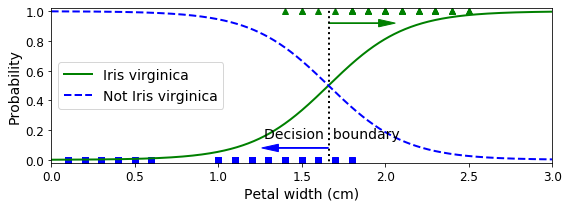

In [85]:
X_new = np.linspace(0, 3, 1000).reshape(-1, 1)
y_proba = log_reg.predict_proba(X_new)
decision_boundary = X_new[y_proba[:, 1] >= 0.5][0]

plt.figure(figsize=(8, 3))
plt.plot(X[y==0], y[y==0], "bs")
plt.plot(X[y==1], y[y==1], "g^")
plt.plot([decision_boundary, decision_boundary], [-1, 2], "k:", linewidth=2)
plt.plot(X_new, y_proba[:, 1], "g-", linewidth=2, label="Iris virginica")
plt.plot(X_new, y_proba[:, 0], "b--", linewidth=2, label="Not Iris virginica")
plt.text(decision_boundary+0.02, 0.15, "Decision  boundary", fontsize=14, color="k", ha="center")
plt.arrow(decision_boundary, 0.08, -0.3, 0, head_width=0.05, head_length=0.1, fc='b', ec='b')
plt.arrow(decision_boundary, 0.92, 0.3, 0, head_width=0.05, head_length=0.1, fc='g', ec='g')
plt.xlabel("Petal width (cm)", fontsize=14)
plt.ylabel("Probability", fontsize=14)
plt.legend(loc="center left", fontsize=14)
plt.axis([0, 3, -0.02, 1.02])
save_fig("logistic_regression_plot")
plt.show()

In [86]:
decision_boundary

array([1.66066066])

In [90]:
log_reg.predict([[1.7]])


array([1])

Saving figure logistic_regression_contour_plot


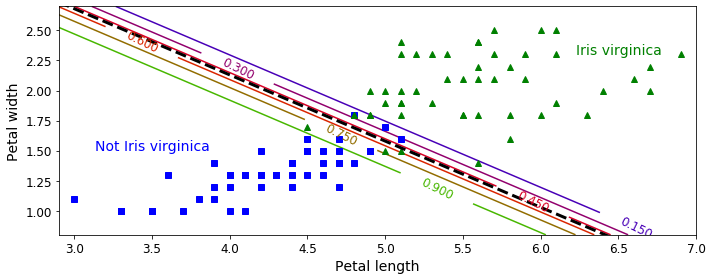

In [95]:
from sklearn.linear_model import LogisticRegression

X = iris["data"][:, (2, 3)]  # petal length, petal width
y = (iris["target"] == 2).astype(np.int)

log_reg = LogisticRegression(solver="lbfgs", C=10**10, random_state=42)
log_reg.fit(X, y)

x0, x1 = np.meshgrid(
        np.linspace(2.9, 7, 500).reshape(-1, 1),
        np.linspace(0.8, 2.7, 200).reshape(-1, 1),
    )
X_new = np.c_[x0.ravel(), x1.ravel()]

y_proba = log_reg.predict_proba(X_new)

plt.figure(figsize=(10, 4))
plt.plot(X[y==0, 0], X[y==0, 1], "bs")
plt.plot(X[y==1, 0], X[y==1, 1], "g^")

zz = y_proba[:, 0].reshape(x0.shape)
contour = plt.contour(x0, x1, zz, cmap=plt.cm.brg)


left_right = np.array([2.9, 7])
boundary = -(log_reg.coef_[0][0] * left_right + log_reg.intercept_[0]) / log_reg.coef_[0][1]

plt.clabel(contour, inline=1, fontsize=12)
plt.plot(left_right, boundary, "k--", linewidth=3)
plt.text(3.5, 1.5, "Not Iris virginica", fontsize=14, color="b", ha="center")
plt.text(6.5, 2.3, "Iris virginica", fontsize=14, color="g", ha="center")
plt.xlabel("Petal length", fontsize=14)
plt.ylabel("Petal width", fontsize=14)
plt.axis([2.9, 7, 0.8, 2.7])
save_fig("logistic_regression_contour_plot")
plt.show()

In [104]:
X = iris["data"][:, (2,3)]
iris["data"][:5]

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2]])

In [105]:
y = iris["target"]

In [106]:
y.shape, y[:5]

((150,), array([0, 0, 0, 0, 0]))

In [108]:
X_with_bias = np.c_[np.ones((len(X), 1)), X]

In [109]:
X_with_bias.shape, X_with_bias[0:4]

((150, 3), array([[1. , 1.4, 0.2],
        [1. , 1.4, 0.2],
        [1. , 1.3, 0.2],
        [1. , 1.5, 0.2]]))

In [110]:
np.random.seed(2042)

In [111]:
test_ratio = 0.2
validation_ratio = 0.2
total_size = len(X_with_bias)

test_size = int(total_size * test_ratio)
validation_size = int(total_size * validation_ratio)
train_size = total_size - test_size - validation_size

rnd_indices = np.random.permutation(total_size)

X_train = X_with_bias[rnd_indices[:train_size]]
y_train = y[rnd_indices[:train_size]]
X_valid = X_with_bias[rnd_indices[train_size:-test_size]]
y_valid = y[rnd_indices[train_size:-test_size]]
X_test = X_with_bias[rnd_indices[-test_size:]]
y_test = y[rnd_indices[-test_size:]]

In [114]:
def to_one_hot(y):
    n_classes = y.max() + 1
    m = len(y)
    Y_one_hot = np.zeros((m, n_classes))
    Y_one_hot[np.arange(m), y] = 1
    return Y_one_hot

In [115]:
y_train[:10]

array([0, 1, 2, 1, 1, 0, 1, 1, 1, 0])

In [116]:
to_one_hot(y_train[:10])

array([[1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [1., 0., 0.]])

In [117]:
Y_train_one_hot = to_one_hot(y_train)
Y_valid_one_hot = to_one_hot(y_valid)
Y_test_one_hot = to_one_hot(y_test)

In [118]:

def softmax(logits):
    exps = np.exp(logits)
    exp_sums = np.sum(exps, axis=1, keepdims=True)
    return exps / exp_sums

In [119]:
n_inputs = X_train.shape[1] # == 3 (2 features plus the bias term)
n_outputs = len(np.unique(y_train))   # == 3 (3 iris classes)

In [122]:
eta = 0.01
n_iterations = 5001
m = len(X_train)
epsilon = 1e-7

Theta = np.random.randn(n_inputs, n_outputs)
logits = X_train.dot(Theta)
Y_proba = softmax(logits)
print(Y_proba.shape)
print(logits.shape)
    
for iteration in range(n_iterations):
    logits = X_train.dot(Theta)
    Y_proba = softmax(logits)
    print(Y_proba)
    loss = -np.mean(np.sum(Y_train_one_hot * np.log(Y_proba + epsilon), axis=1))
    
    error = Y_proba - Y_train_one_hot
    if iteration % 500 == 0:
        print(iteration, loss)
    gradients = 1/m * X_train.T.dot(error)
    Theta = Theta - eta * gradients

(90, 3)
(90, 3)
[[9.01617096e-01 5.07573258e-02 4.76255781e-02]
 [9.99141267e-01 2.91873085e-04 5.66860336e-04]
 [9.99837933e-01 3.73283509e-05 1.24739085e-04]
 [9.98933023e-01 3.59571138e-04 7.07405685e-04]
 [9.99141267e-01 2.91873085e-04 5.66860336e-04]
 [7.94914738e-01 1.03162618e-01 1.01922644e-01]
 [9.99505750e-01 1.61499388e-04 3.32750941e-04]
 [9.99815784e-01 5.88520232e-05 1.25363989e-04]
 [9.99742508e-01 8.63435367e-05 1.71148520e-04]
 [9.01617096e-01 5.07573258e-02 4.76255781e-02]
 [9.99680000e-01 1.06385878e-04 2.13613647e-04]
 [9.99945409e-01 1.51229180e-05 3.94684047e-05]
 [9.08519685e-01 4.94252185e-02 4.20550967e-02]
 [9.99560140e-01 1.35636179e-04 3.04224195e-04]
 [9.98798224e-01 4.28099953e-04 7.73675976e-04]
 [9.99964706e-01 9.96050538e-06 2.53333107e-05]
 [9.99792800e-01 7.00761733e-05 1.37123532e-04]
 [9.99154965e-01 2.53654971e-04 5.91380061e-04]
 [8.94028310e-01 5.20823060e-02 5.38893842e-02]
 [9.99988132e-01 3.50659037e-06 8.36155621e-06]
 [9.99512507e-01 1.40351

[[0.33366222 0.38034215 0.28599563]
 [0.19032352 0.36642311 0.44325338]
 [0.10153696 0.31128648 0.58717655]
 [0.18515164 0.36414139 0.45070697]
 [0.19032352 0.36642311 0.44325338]
 [0.30634352 0.38026334 0.31339315]
 [0.18229571 0.36384236 0.45386192]
 [0.18453438 0.36589488 0.44957075]
 [0.19791513 0.37056086 0.431524  ]
 [0.33366222 0.38034215 0.28599563]
 [0.19261965 0.36841154 0.43896881]
 [0.15251155 0.35158082 0.49590763]
 [0.36580979 0.37732892 0.25686129]
 [0.16482964 0.35589566 0.4792747 ]
 [0.20398531 0.37084362 0.42517107]
 [0.16166937 0.35714618 0.48118444]
 [0.20329838 0.37261676 0.42408486]
 [0.15101358 0.34758388 0.50140254]
 [0.30247842 0.38103466 0.31648693]
 [0.18615802 0.36969161 0.44415037]
 [0.14418499 0.34404092 0.51177408]
 [0.21750263 0.3764389  0.40605847]
 [0.22395407 0.37635725 0.39968868]
 [0.14807025 0.34869228 0.50323747]
 [0.26616478 0.37850831 0.35532691]
 [0.22876476 0.37270311 0.39853213]
 [0.34060714 0.38007481 0.27931805]
 [0.12256935 0.33338191 0.54

[[0.34557173 0.38259844 0.27182982]
 [0.15727669 0.3926771  0.4500462 ]
 [0.07271339 0.33069186 0.59659475]
 [0.15382551 0.38920094 0.45697355]
 [0.15727669 0.3926771  0.4500462 ]
 [0.32452824 0.37892629 0.29654547]
 [0.1465906  0.39123143 0.46217796]
 [0.14283433 0.39679663 0.46036904]
 [0.15668575 0.40182242 0.44149183]
 [0.34557173 0.38259844 0.27182982]
 [0.15327814 0.39834483 0.44837703]
 [0.10951342 0.38161068 0.5088759 ]
 [0.37975722 0.37794768 0.2422951 ]
 [0.13031157 0.38178215 0.48790627]
 [0.17222355 0.39694746 0.43082899]
 [0.11488409 0.38982029 0.49529562]
 [0.1601352  0.40524452 0.43462029]
 [0.12138135 0.37009015 0.5085285 ]
 [0.31235994 0.38471548 0.30292458]
 [0.12903649 0.40968072 0.46128279]
 [0.11267236 0.36722256 0.52010508]
 [0.1751668  0.4092149  0.4156183 ]
 [0.19208245 0.4032953  0.40462225]
 [0.10689102 0.37745809 0.51565088]
 [0.27550078 0.38252586 0.34197336]
 [0.23055997 0.38067785 0.38876218]
 [0.35085151 0.38331342 0.26583507]
 [0.07861431 0.36245549 0.55

[[0.37016444 0.37358671 0.25624884]
 [0.15439374 0.39627417 0.44933209]
 [0.06676546 0.33133345 0.60190109]
 [0.15132936 0.39253734 0.4561333 ]
 [0.15439374 0.39627417 0.44933209]
 [0.35095703 0.36950259 0.27954038]
 [0.14222318 0.39507873 0.46269809]
 [0.13635084 0.40136072 0.46228844]
 [0.15106696 0.40654408 0.44238895]
 [0.37016444 0.37358671 0.25624884]
 [0.14808874 0.40276515 0.44914612]
 [0.10109373 0.38532417 0.5135821 ]
 [0.40637002 0.36710988 0.2265201 ]
 [0.12544266 0.38520253 0.48935481]
 [0.17064095 0.40041509 0.42894396]
 [0.10561964 0.39415161 0.50022875]
 [0.15407473 0.41027765 0.43564762]
 [0.11759824 0.37275184 0.50964992]
 [0.33476039 0.3774445  0.28779511]
 [0.11745317 0.41574292 0.46680391]
 [0.10781438 0.36986469 0.52232093]
 [0.17016352 0.41426096 0.41557552]
 [0.19160393 0.40672511 0.40167096]
 [0.09887627 0.38087793 0.5202458 ]
 [0.29596505 0.37676754 0.32726741]
 [0.2454399  0.37778761 0.3767725 ]
 [0.3749488  0.37443547 0.25061573]
 [0.06895729 0.36447078 0.56

[[0.39504597 0.36368671 0.24126732]
 [0.15323453 0.39887964 0.44788583]
 [0.0624319  0.33132796 0.60624015]
 [0.15047372 0.39493192 0.45459436]
 [0.15323453 0.39887964 0.44788583]
 [0.37757298 0.35924116 0.26318587]
 [0.1397045  0.39790716 0.46238834]
 [0.13203649 0.40476109 0.46320242]
 [0.14757838 0.41007665 0.44234497]
 [0.39504597 0.36368671 0.24126732]
 [0.14493279 0.40605543 0.44901178]
 [0.09501941 0.3879075  0.51707309]
 [0.43303413 0.35545675 0.21150912]
 [0.12236722 0.38768167 0.48995111]
 [0.17074101 0.402866   0.42639299]
 [0.09891757 0.39722502 0.50385741]
 [0.15024414 0.41406022 0.43569564]
 [0.11535778 0.37461582 0.5100264 ]
 [0.35763303 0.36926027 0.2731067 ]
 [0.10903208 0.42018033 0.47078759]
 [0.10460562 0.37168956 0.52370481]
 [0.16734287 0.41803315 0.41462397]
 [0.19284356 0.40906195 0.39809448]
 [0.09310321 0.38322767 0.52366912]
 [0.31700536 0.37012896 0.31286568]
 [0.26108243 0.37408078 0.36483679]
 [0.39936945 0.36465174 0.23597881]
 [0.06192898 0.36536811 0.57

[[0.42004945 0.35328298 0.22666756]
 [0.15200348 0.40154962 0.4464469 ]
 [0.05836092 0.33124282 0.61039625]
 [0.149544   0.39738794 0.45306806]
 [0.15200348 0.40154962 0.4464469 ]
 [0.40452063 0.34833976 0.24713961]
 [0.13716211 0.4007846  0.46205329]
 [0.12779163 0.40817882 0.46402954]
 [0.14409333 0.41365729 0.44224938]
 [0.42004945 0.35328298 0.22666756]
 [0.1417703  0.40939459 0.4488351 ]
 [0.08926152 0.39039656 0.52034192]
 [0.45961963 0.34335992 0.19702045]
 [0.11931203 0.39018663 0.49050134]
 [0.17074069 0.40538855 0.42387076]
 [0.09258446 0.40018401 0.50723153]
 [0.14642819 0.41788954 0.43568227]
 [0.113111   0.37650699 0.51038201]
 [0.38078084 0.36055262 0.25866654]
 [0.1011331  0.42443861 0.47442829]
 [0.1014502  0.37351866 0.52503114]
 [0.16447595 0.42187907 0.41364497]
 [0.19396289 0.41147348 0.39456363]
 [0.08762212 0.3854921  0.52688578]
 [0.33847538 0.36295429 0.29857033]
 [0.27708976 0.37000517 0.35290507]
 [0.42386546 0.35439722 0.22173732]
 [0.05558391 0.36602915 0.57

[[0.44416372 0.34288621 0.21295007]
 [0.15055239 0.40430627 0.44514134]
 [0.05455045 0.33112857 0.61432098]
 [0.1483891  0.39992996 0.45168094]
 [0.15055239 0.40430627 0.44514134]
 [0.43072248 0.33731908 0.23195844]
 [0.13449015 0.40372207 0.46178778]
 [0.12355082 0.41161258 0.4648366 ]
 [0.14051474 0.41728867 0.44219659]
 [0.44416372 0.34288621 0.21295007]
 [0.13850116 0.41278816 0.44871068]
 [0.08381161 0.39280139 0.52338699]
 [0.4850589  0.33140182 0.18353928]
 [0.1162015  0.39272739 0.49107111]
 [0.17044548 0.40801863 0.4215359 ]
 [0.08661444 0.40303328 0.51035228]
 [0.14253295 0.42176532 0.43570173]
 [0.11077554 0.37844315 0.5107813 ]
 [0.40326498 0.35175799 0.24497703]
 [0.09375712 0.4285084  0.47773448]
 [0.09829495 0.37536793 0.52633712]
 [0.16143077 0.42580778 0.41276145]
 [0.19471831 0.41401291 0.39126879]
 [0.08242327 0.3876839  0.52989284]
 [0.35951032 0.35560712 0.28488256]
 [0.29279856 0.36580005 0.34140139]
 [0.44744236 0.34417944 0.20837821]
 [0.04991025 0.36651733 0.58

[[0.46631173 0.33305284 0.20063543]
 [0.14897012 0.4070218  0.44400809]
 [0.05113197 0.33098814 0.61787989]
 [0.14708468 0.40244015 0.45047517]
 [0.14897012 0.4070218  0.44400809]
 [0.45495978 0.32679183 0.21824839]
 [0.13182426 0.40658306 0.46159268]
 [0.11950616 0.41490527 0.46558858]
 [0.13701599 0.42080333 0.44218068]
 [0.46631173 0.33305284 0.20063543]
 [0.13528598 0.41607922 0.44863481]
 [0.07887215 0.39502019 0.52610766]
 [0.50824351 0.32020432 0.17155217]
 [0.11318294 0.3951855  0.49163156]
 [0.16989821 0.41063556 0.41946623]
 [0.08122532 0.40565458 0.51312009]
 [0.13874474 0.42550933 0.43574593]
 [0.10846695 0.38033255 0.51120051]
 [0.42406294 0.34335911 0.23257794]
 [0.08716145 0.43222774 0.48061082]
 [0.09528236 0.37714992 0.52756772]
 [0.1583655  0.42963769 0.41199681]
 [0.1951108  0.41656516 0.38832404]
 [0.07770156 0.38970923 0.53258921]
 [0.37913327 0.34850335 0.27236338]
 [0.30748913 0.36171099 0.33079988]
 [0.46905797 0.33453994 0.1964021 ]
 [0.04504205 0.366835   0.58

[[0.48842138 0.32298511 0.1885935 ]
 [0.14715024 0.40992328 0.44292648]
 [0.04779407 0.3308014  0.62140453]
 [0.14554778 0.40512839 0.44932382]
 [0.14715024 0.40992328 0.44292648]
 [0.47930344 0.31592231 0.20477426]
 [0.12895964 0.40960608 0.46143429]
 [0.11532641 0.4183323  0.46634128]
 [0.13332044 0.42449533 0.44218423]
 [0.48842138 0.32298511 0.1885935 ]
 [0.13187262 0.41954281 0.44858457]
 [0.0740043  0.3972405  0.5287552 ]
 [0.53120914 0.30884882 0.15994204]
 [0.11001495 0.39776471 0.49222034]
 [0.16908594 0.41345917 0.41745489]
 [0.07593534 0.40827193 0.51579274]
 [0.13476184 0.42943516 0.43580301]
 [0.10600534 0.38233031 0.51166435]
 [0.44497474 0.33468066 0.22034459]
 [0.0807476  0.43592104 0.48333136]
 [0.09216557 0.37901    0.52882444]
 [0.15504751 0.43368961 0.41126288]
 [0.19521292 0.41934526 0.38544182]
 [0.07303884 0.39173819 0.53522297]
 [0.39903051 0.34107845 0.25989104]
 [0.32243743 0.35741439 0.32014818]
 [0.49060256 0.32469243 0.18470501]
 [0.04049114 0.36701685 0.59

[[0.50974424 0.31305258 0.17720317]
 [0.14516676 0.41291658 0.44191666]
 [0.04464527 0.33056442 0.62479031]
 [0.14384245 0.40790784 0.44824971]
 [0.14516676 0.41291658 0.44191666]
 [0.50290525 0.30511987 0.19197487]
 [0.12600505 0.41269014 0.46130481]
 [0.11116416 0.42177639 0.46705945]
 [0.12956608 0.42824071 0.44219322]
 [0.50974424 0.31305258 0.17720317]
 [0.12838917 0.42306283 0.448548  ]
 [0.0693726  0.39938169 0.53124571]
 [0.55318238 0.29775068 0.14906695]
 [0.10681489 0.40037656 0.49280855]
 [0.16804938 0.41640045 0.41555017]
 [0.07092208 0.410792   0.51828592]
 [0.13073231 0.43341079 0.4358569 ]
 [0.10348337 0.38436772 0.51214891]
 [0.46529304 0.32604088 0.20866608]
 [0.07472724 0.43946092 0.48581184]
 [0.08905796 0.38088171 0.53006034]
 [0.15160354 0.43782976 0.4105667 ]
 [0.19503578 0.42226773 0.38269649]
 [0.06859323 0.39369628 0.53771049]
 [0.41852941 0.33360446 0.24786613]
 [0.33715425 0.35306612 0.30977963]
 [0.51135207 0.31499607 0.17365185]
 [0.03638177 0.36705225 0.59

[[0.52967558 0.30358069 0.16674373]
 [0.14310818 0.41590232 0.4409895 ]
 [0.04176476 0.33028045 0.62795479]
 [0.14204844 0.41068603 0.44726552]
 [0.14310818 0.41590232 0.4409895 ]
 [0.5250627  0.29475531 0.18018199]
 [0.12307283 0.4157333  0.46119387]
 [0.10715986 0.42512574 0.4677144 ]
 [0.12588884 0.43191688 0.44219428]
 [0.52967558 0.30358069 0.16674373]
 [0.12496364 0.4265237  0.44851266]
 [0.0651026  0.40137836 0.53351904]
 [0.57356118 0.2872622  0.13917662]
 [0.10369621 0.40293447 0.49336931]
 [0.16685303 0.41936159 0.41378538]
 [0.06631845 0.41313966 0.52054189]
 [0.12680009 0.43730651 0.4358934 ]
 [0.10099474 0.38637588 0.51262938]
 [0.48442702 0.31772984 0.19784313]
 [0.069251   0.44274708 0.48800193]
 [0.08606438 0.38270175 0.53123386]
 [0.14816703 0.44192199 0.40991098]
 [0.19462259 0.42523492 0.38014249]
 [0.06448658 0.39552287 0.53999055]
 [0.43704707 0.32633969 0.23661324]
 [0.35120791 0.34881663 0.29997546]
 [0.5307253  0.30576474 0.16350996]
 [0.03277937 0.36694915 0.60

[[0.54853738 0.29445742 0.1570052 ]
 [0.1409755  0.41890945 0.44011506]
 [0.03909538 0.3299451  0.63095952]
 [0.14017013 0.41348959 0.44634028]
 [0.1409755  0.41890945 0.44011506]
 [0.54610334 0.28472226 0.16917441]
 [0.12014557 0.41876656 0.46108787]
 [0.10327156 0.42841782 0.46831062]
 [0.12225999 0.43556288 0.44217713]
 [0.54853738 0.29445742 0.1570052 ]
 [0.1215712  0.42996169 0.44846712]
 [0.06111805 0.40325946 0.53562249]
 [0.59269953 0.27724608 0.13005439]
 [0.10063205 0.40546503 0.49390293]
 [0.16551489 0.42237022 0.41211489]
 [0.06203901 0.4153505  0.52261049]
 [0.1229324  0.4411642  0.4359034 ]
 [0.09852252 0.38837416 0.51310332]
 [0.50266727 0.30965801 0.18767472]
 [0.06420755 0.44583391 0.48995854]
 [0.08315358 0.38448862 0.5323578 ]
 [0.1447202  0.44600812 0.40927168]
 [0.1940071  0.4282733  0.3777196 ]
 [0.06064702 0.39724378 0.5421092 ]
 [0.45484485 0.3192148  0.22594036]
 [0.36480026 0.34462599 0.29057375]
 [0.54904185 0.29688561 0.15407254]
 [0.02957567 0.36671868 0.60

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[0.63189668 0.25239163 0.1157117 ]
 [0.12929341 0.43478428 0.43592231]
 [0.02798574 0.32736198 0.64465228]
 [0.12965594 0.42837101 0.44197306]
 [0.12929341 0.43478428 0.43592231]
 [0.63958219 0.23803787 0.12237994]
 [0.10539064 0.4343085  0.46030086]
 [0.08498742 0.44462039 0.47039219]
 [0.10448074 0.45398543 0.44153383]
 [0.63189668 0.25239163 0.1157117 ]
 [0.10480251 0.44741193 0.44778556]
 [0.04426206 0.4113612  0.54437674]
 [0.6754726  0.23213848 0.09238892]
 [0.08577615 0.41814041 0.49608343]
 [0.15705345 0.43864772 0.40429883]
 [0.04413144 0.42489281 0.53097575]
 [0.10414071 0.46057038 0.43528891]
 [0.0862034  0.39853879 0.5152578 ]
 [0.58500932 0.27156958 0.1434211 ]
 [0.04365784 0.45913719 0.49720497]
 [0.06940323 0.39321013 0.53738665]
 [0.12715202 0.46705678 0.4057912 ]
 [0.18849723 0.44505543 0.36644735]
 [0.04431471 0.40464095 0.55104434]
 [0.53707872 0.28469246 0.17822882]
 [0.42909401 0.32395059 0.2469554 ]
 [0.62986047 0.25606075 0.11407878]
 [0.01766506 0.36377471 0.61

[[0.64708278 0.24443148 0.10848573]
 [0.12674245 0.43823866 0.43501889]
 [0.0260896  0.32662752 0.64728288]
 [0.12732468 0.43162582 0.4410495 ]
 [0.12674245 0.43823866 0.43501889]
 [0.65663126 0.22916264 0.1142061 ]
 [0.10237175 0.43759627 0.46003199]
 [0.08147239 0.44791581 0.4706118 ]
 [0.1009323  0.45783074 0.44123696]
 [0.64708278 0.24443148 0.10848573]
 [0.10142923 0.45107021 0.44750055]
 [0.041343   0.41277661 0.54588038]
 [0.69021758 0.2237998  0.08598263]
 [0.0828372  0.42076177 0.49640103]
 [0.15502773 0.44226935 0.40270292]
 [0.04106671 0.42657021 0.53236308]
 [0.10041858 0.46460365 0.43497776]
 [0.08370635 0.40067109 0.51562255]
 [0.60034775 0.26419452 0.13545773]
 [0.04024299 0.46148719 0.49826982]
 [0.06674551 0.39496311 0.53829138]
 [0.12352447 0.47153117 0.40494436]
 [0.18695906 0.44885554 0.3641854 ]
 [0.04146953 0.40592742 0.55260306]
 [0.55276241 0.27783649 0.1694011 ]
 [0.44171685 0.31975936 0.23852379]
 [0.64457337 0.24834957 0.10707705]
 [0.01586876 0.36281215 0.62

[[0.65872834 0.23826535 0.10300631]
 [0.12469106 0.44103386 0.43427508]
 [0.024664   0.32599119 0.6493448 ]
 [0.12544299 0.43426361 0.4402934 ]
 [0.12469106 0.44103386 0.43427508]
 [0.66969477 0.2222865  0.10801873]
 [0.09998454 0.4402344  0.45978107]
 [0.07874045 0.45052895 0.4707306 ]
 [0.09814549 0.46090376 0.44095075]
 [0.65872834 0.23826535 0.10300631]
 [0.09877415 0.45399764 0.44722821]
 [0.03914056 0.41384361 0.54701583]
 [0.70145165 0.21738348 0.08116487]
 [0.08053425 0.42285073 0.49661502]
 [0.15336343 0.44521881 0.40141776]
 [0.03876249 0.42783862 0.53339889]
 [0.09750161 0.46782269 0.4346757 ]
 [0.08173649 0.40237751 0.51588599]
 [0.61218802 0.2584432  0.12936878]
 [0.037698   0.46327049 0.49903151]
 [0.06467607 0.39634723 0.5389767 ]
 [0.12064914 0.47512602 0.40422484]
 [0.18565593 0.4519654  0.36237867]
 [0.03931904 0.4068951  0.55378586]
 [0.56495279 0.27245111 0.1625961 ]
 [0.45162743 0.31644409 0.23192847]
 [0.65585665 0.24237792 0.10176542]
 [0.01456546 0.36196116 0.62

[[0.66893264 0.23281776 0.0982496 ]
 [0.12282353 0.44359669 0.43357977]
 [0.02343567 0.32537582 0.65118851]
 [0.12372498 0.43668526 0.43958976]
 [0.12282353 0.44359669 0.43357977]
 [0.68112995 0.21621285 0.1026572 ]
 [0.09784036 0.4426364  0.45952325]
 [0.07632118 0.4528847  0.47079412]
 [0.0956564  0.46369218 0.44065142]
 [0.66893264 0.23281776 0.0982496 ]
 [0.0963984  0.45665692 0.44694468]
 [0.03723763 0.41476359 0.54799878]
 [0.71124232 0.21174617 0.07701151]
 [0.07848101 0.42474179 0.49677719]
 [0.15182296 0.44793741 0.40023963]
 [0.03677752 0.42893565 0.53428683]
 [0.09490087 0.4707404  0.43435874]
 [0.07997053 0.40392775 0.51610172]
 [0.62262052 0.25333365 0.12404583]
 [0.03552188 0.46481857 0.49965955]
 [0.06284051 0.39759035 0.53956914]
 [0.11806163 0.47840229 0.40353608]
 [0.18442212 0.45484307 0.36073481]
 [0.03745822 0.40772769 0.5548141 ]
 [0.57575548 0.26763797 0.15660655]
 [0.46048808 0.31346291 0.22604901]
 [0.66574469 0.23710296 0.09715235]
 [0.01347558 0.36112713 0.62

[[0.67892354 0.22744325 0.09363321]
 [0.12092991 0.44621689 0.43285319]
 [0.02225232 0.32471604 0.65303164]
 [0.12197839 0.43916419 0.43885742]
 [0.12092991 0.44621689 0.43285319]
 [0.69231224 0.21022344 0.09746432]
 [0.09569281 0.4450761  0.45923109]
 [0.07392997 0.45525501 0.47081502]
 [0.09317641 0.46651514 0.44030845]
 [0.67892354 0.22744325 0.09363321]
 [0.09402734 0.45935201 0.44662066]
 [0.03539983 0.41564922 0.54895095]
 [0.72077953 0.20621332 0.07300716]
 [0.07643861 0.4266521  0.49690929]
 [0.15023779 0.45073057 0.39903164]
 [0.03486594 0.42999527 0.53513879]
 [0.09231394 0.47369115 0.43399491]
 [0.07820482 0.40549908 0.51629609]
 [0.63288856 0.24826605 0.11884538]
 [0.0334411  0.46632012 0.50023877]
 [0.06102334 0.39883662 0.54014004]
 [0.1154656  0.48173276 0.40280165]
 [0.18312762 0.45781025 0.35906214]
 [0.03565854 0.40852732 0.55581414]
 [0.58644544 0.26283752 0.15071704]
 [0.46933345 0.31047158 0.22019497]
 [0.6754276  0.2318992  0.0926732 ]
 [0.012455   0.36022354 0.62

[[0.68738427 0.2228598  0.08975593]
 [0.11927455 0.44852806 0.4321974 ]
 [0.02126546 0.32410916 0.65462538]
 [0.120448   0.44135327 0.43819872]
 [0.11927455 0.44852806 0.4321974 ]
 [0.70176888 0.205119   0.09311212]
 [0.0938363  0.447215   0.4589487 ]
 [0.07188793 0.45731486 0.47079722]
 [0.09104285 0.46898246 0.4399747 ]
 [0.68738427 0.2228598  0.08975593]
 [0.09198426 0.46170993 0.44630581]
 [0.03386384 0.41638625 0.5497499 ]
 [0.72881788 0.2015175  0.06966462]
 [0.07468404 0.42831843 0.49699754]
 [0.14883389 0.45320543 0.39796068]
 [0.03327257 0.43088027 0.53584716]
 [0.09009179 0.47626762 0.4336406 ]
 [0.07668075 0.4068741  0.51644515]
 [0.64162673 0.24392313 0.11445014]
 [0.03171832 0.46757996 0.50070172]
 [0.05946909 0.39991591 0.540615  ]
 [0.11321789 0.48465462 0.40212749]
 [0.18196194 0.46044776 0.35759029]
 [0.0341524  0.40919116 0.55665645]
 [0.59558842 0.25870217 0.1457094 ]
 [0.47696337 0.30787959 0.21515705]
 [0.68362924 0.22746148 0.08890928]
 [0.01162628 0.35938548 0.62

[[0.69751838 0.21733038 0.08515124]
 [0.11722753 0.45141636 0.43135611]
 [0.02010225 0.32331895 0.6565788 ]
 [0.11855116 0.44409232 0.43735652]
 [0.11722753 0.45141636 0.43135611]
 [0.71307719 0.19896674 0.08795607]
 [0.09156613 0.44987141 0.45856246]
 [0.06942187 0.45984988 0.47072825]
 [0.08844674 0.47203693 0.43951634]
 [0.69751838 0.21733038 0.08515124]
 [0.08949426 0.46463202 0.44587372]
 [0.0320495  0.41725175 0.55069874]
 [0.73839941 0.19588037 0.06572021]
 [0.07255215 0.43037716 0.49707069]
 [0.14707549 0.45631249 0.39661202]
 [0.03139568 0.43192388 0.53668043]
 [0.08739217 0.47945392 0.43315391]
 [0.07481994 0.40857861 0.51660145]
 [0.65214623 0.23865744 0.10919633]
 [0.02970316 0.46907365 0.50122318]
 [0.05758899 0.40123939 0.54117162]
 [0.11046514 0.48828566 0.40124921]
 [0.18047859 0.46376967 0.35575174]
 [0.03237083 0.40996846 0.55766071]
 [0.60665209 0.25366157 0.13968634]
 [0.48628053 0.3047003  0.20901917]
 [0.69345568 0.22210775 0.08443657]
 [0.01067604 0.35828612 0.63

[[0.70539002 0.21300514 0.08160484]
 [0.11558788 0.45375686 0.43065527]
 [0.01921321 0.32265354 0.65813324]
 [0.11702845 0.44631453 0.43665702]
 [0.11558788 0.45375686 0.43065527]
 [0.72184467 0.19415975 0.08399558]
 [0.08976729 0.45201088 0.45822183]
 [0.06749158 0.46187328 0.47063514]
 [0.08639956 0.47448914 0.4391113 ]
 [0.70539002 0.21300514 0.08160484]
 [0.08752765 0.46698041 0.44549194]
 [0.03066001 0.41790968 0.55143031]
 [0.74580633 0.19149217 0.0627015 ]
 [0.07087332 0.43202682 0.49709985]
 [0.1456499  0.45884143 0.39550867]
 [0.0299623  0.43272093 0.53731677]
 [0.08526669 0.48200935 0.43272396]
 [0.0733476  0.409949   0.5167034 ]
 [0.66035822 0.23451801 0.10512377]
 [0.02817494 0.47022144 0.50160362]
 [0.05611483 0.40229199 0.54159319]
 [0.10828069 0.49121158 0.40050773]
 [0.17925835 0.46648174 0.3542599 ]
 [0.03100453 0.41055744 0.55843803]
 [0.61533275 0.2496785  0.13498876]
 [0.4936592  0.30217185 0.20416895]
 [0.70109075 0.21791963 0.08098962]
 [0.00996945 0.35735438 0.63

[[0.7138863  0.20830627 0.07780744]
 [0.11376801 0.45638566 0.42984632]
 [0.01826815 0.32188033 0.65985152]
 [0.11533504 0.4488133  0.43585165]
 [0.11376801 0.45638566 0.42984632]
 [0.73128972 0.18894406 0.07976622]
 [0.08779032 0.45440037 0.45780931]
 [0.06539398 0.46411423 0.47049179]
 [0.08415969 0.47721969 0.43862062]
 [0.7138863  0.20830627 0.07780744]
 [0.08537276 0.46959793 0.44502931]
 [0.02918036 0.41860428 0.55221537]
 [0.75376575 0.18674611 0.05948814]
 [0.06903871 0.43386059 0.4971007 ]
 [0.14405049 0.46169341 0.3942561 ]
 [0.02843989 0.43356654 0.53799357]
 [0.08294451 0.48485207 0.43220341]
 [0.07173157 0.41147717 0.51679127]
 [0.66926318 0.23000027 0.10073656]
 [0.02656245 0.47144705 0.50199049]
 [0.05451025 0.40345387 0.54203588]
 [0.10587675 0.49448065 0.3996426 ]
 [0.17787182 0.46954864 0.35257954]
 [0.02954767 0.41117714 0.55927518]
 [0.62479012 0.24531059 0.12989929]
 [0.50177035 0.29938189 0.19884776]
 [0.70933448 0.21336921 0.07729631]
 [0.00923735 0.35626573 0.63

[[0.72194085 0.20382179 0.07423736]
 [0.11199343 0.45898344 0.42902313]
 [0.01738645 0.32109028 0.66152327]
 [0.1136805  0.45128548 0.43503401]
 [0.11199343 0.45898344 0.42902313]
 [0.74022425 0.18397377 0.07580197]
 [0.08588166 0.45674807 0.45737027]
 [0.06339226 0.46629692 0.47031082]
 [0.08200716 0.47989403 0.43809881]
 [0.72194085 0.20382179 0.07423736]
 [0.08329877 0.4721642  0.44453703]
 [0.0277975  0.4192464  0.5529561 ]
 [0.76127718 0.18223729 0.05648553]
 [0.06727774 0.43565361 0.49706865]
 [0.14247404 0.46452329 0.39300266]
 [0.02702096 0.43435274 0.5386263 ]
 [0.08071622 0.48763346 0.43165032]
 [0.0701734  0.41297635 0.51685024]
 [0.67774578 0.22566819 0.09658603]
 [0.02506987 0.47259514 0.502335  ]
 [0.05297632 0.4045817  0.54244199]
 [0.10355283 0.49769342 0.39875375]
 [0.17648819 0.47260005 0.35091176]
 [0.02818427 0.41174777 0.56006796]
 [0.63384237 0.24110168 0.12505595]
 [0.50960836 0.29667563 0.19371601]
 [0.71715268 0.20902571 0.07382161]
 [0.00857229 0.35514754 0.63

[[0.72980408 0.19941494 0.07078097]
 [0.11021336 0.46162636 0.42816028]
 [0.01653934 0.32026097 0.66319969]
 [0.11201771 0.45380356 0.43417873]
 [0.11021336 0.46162636 0.42816028]
 [0.74892627 0.17909765 0.07197608]
 [0.08398546 0.45912316 0.45689138]
 [0.06142608 0.46848626 0.47008767]
 [0.07987829 0.48259109 0.43753062]
 [0.72980408 0.19941494 0.07078097]
 [0.08124453 0.47475493 0.44400055]
 [0.02646676 0.41985635 0.55367689]
 [0.76857774 0.17782628 0.05359598]
 [0.06553811 0.43745905 0.49700284]
 [0.14087653 0.46741371 0.39170976]
 [0.0256592  0.43510429 0.53923651]
 [0.07851567 0.49043565 0.43104868]
 [0.06862732 0.41449098 0.5168817 ]
 [0.68606602 0.22139132 0.09254267]
 [0.02364716 0.47370178 0.50265106]
 [0.05146691 0.40570922 0.54282386]
 [0.10124118 0.50094417 0.39781465]
 [0.17506985 0.47572474 0.34920541]
 [0.02687047 0.41228742 0.56084211]
 [0.64276317 0.23692658 0.12031025]
 [0.51740741 0.29397298 0.18861961]
 [0.72478844 0.20475656 0.070455  ]
 [0.00794995 0.35396805 0.63

[[0.7378875  0.19485401 0.06725849]
 [0.10833295 0.46446199 0.42720507]
 [0.01568289 0.31934363 0.66497349]
 [0.11025787 0.45650851 0.43323361]
 [0.10833295 0.46446199 0.42720507]
 [0.75784893 0.17406059 0.06809048]
 [0.08200176 0.46165693 0.45634131]
 [0.05939287 0.47080142 0.46980571]
 [0.07766141 0.48545896 0.43687963]
 [0.7378875  0.19485401 0.06725849]
 [0.0791021  0.47751267 0.44338523]
 [0.02511924 0.42046418 0.55441658]
 [0.77604895 0.17328172 0.05066933]
 [0.06372858 0.43937598 0.49689545]
 [0.13917183 0.47052716 0.39030101]
 [0.02428413 0.43585872 0.53985715]
 [0.07622761 0.49341219 0.4303602 ]
 [0.06701186 0.41610478 0.51688336]
 [0.69466056 0.21694387 0.08839557]
 [0.02222067 0.47482336 0.50295597]
 [0.0499031  0.40689761 0.54319929]
 [0.09881986 0.5044122  0.39676794]
 [0.17353928 0.479099   0.34736171]
 [0.02553825 0.41282241 0.56163934]
 [0.65202224 0.23256393 0.11541383]
 [0.52558497 0.29112871 0.18328632]
 [0.73264181 0.20033703 0.06702116]
 [0.0073376  0.35265704 0.64

[[0.74571919 0.19040439 0.06387642]
 [0.10646082 0.4673334  0.42620578]
 [0.01486732 0.31838678 0.6667459 ]
 [0.1085025  0.45925103 0.43224647]
 [0.10646082 0.4673334  0.42620578]
 [0.76646929 0.16915698 0.06437374]
 [0.080046   0.46420795 0.45574605]
 [0.05741183 0.47311147 0.4694767 ]
 [0.075486   0.48833657 0.43617743]
 [0.74571919 0.19040439 0.06387642]
 [0.07699648 0.48028284 0.44272068]
 [0.02383412 0.42103254 0.55513334]
 [0.78325447 0.16886843 0.0478771 ]
 [0.06195482 0.44129675 0.49674843]
 [0.13745756 0.47369233 0.38885012]
 [0.02297652 0.43657022 0.54045327]
 [0.07398582 0.4963956  0.42961858]
 [0.06542106 0.41772776 0.51685118]
 [0.70302843 0.21258401 0.08438756]
 [0.02087403 0.47589286 0.50323312]
 [0.04837635 0.40807952 0.54354413]
 [0.09642974 0.50790343 0.39566683]
 [0.17198327 0.4825377  0.34547904]
 [0.02426588 0.41331964 0.56241448]
 [0.66108089 0.22826626 0.11065285]
 [0.53367145 0.28830559 0.17802296]
 [0.74025468 0.19602408 0.06372124]
 [0.00677054 0.35128296 0.64

[[0.75236292 0.18660514 0.06103194]
 [0.10483272 0.46987264 0.42529463]
 [0.01418669 0.31751814 0.66829517]
 [0.10697333 0.46167914 0.43134752]
 [0.10483272 0.46987264 0.42529463]
 [0.77376156 0.16497916 0.06125928]
 [0.07836037 0.46645195 0.45518768]
 [0.05572301 0.47512656 0.46915043]
 [0.07361923 0.49085977 0.435521  ]
 [0.75236292 0.18660514 0.06103194]
 [0.07518698 0.48271437 0.44209865]
 [0.02276018 0.42149722 0.5557426 ]
 [0.78934127 0.16511617 0.04554256]
 [0.06043419 0.44297899 0.49658682]
 [0.13595318 0.47650132 0.3875455 ]
 [0.02188676 0.43715719 0.54095605]
 [0.07206486 0.49900889 0.42892625]
 [0.06405147 0.41915416 0.51679437]
 [0.71015942 0.20884472 0.08099586]
 [0.01975941 0.47678544 0.50345515]
 [0.04707232 0.40910752 0.54382016]
 [0.09436749 0.51097373 0.39465877]
 [0.17060446 0.48559603 0.3437995 ]
 [0.02320117 0.41372352 0.56307532]
 [0.66883512 0.2245637  0.10660118]
 [0.54066447 0.28585571 0.17347981]
 [0.74671625 0.19234035 0.0609434 ]
 [0.00630952 0.35002995 0.64

[[0.75885494 0.18287004 0.05827502]
 [0.10320539 0.4724526  0.42434201]
 [0.01353176 0.31661482 0.66985342]
 [0.10544252 0.46414892 0.43040856]
 [0.10320539 0.4724526  0.42434201]
 [0.78086772 0.16088078 0.05825151]
 [0.07668935 0.46872089 0.45458977]
 [0.05406573 0.47714823 0.46878604]
 [0.07177612 0.49340332 0.43482057]
 [0.75885494 0.18287004 0.05827502]
 [0.073398   0.48516791 0.44143408]
 [0.0217256  0.42193425 0.55634014]
 [0.79526604 0.16144167 0.04329229]
 [0.05893412 0.44467317 0.49639272]
 [0.13443713 0.47936456 0.38619831]
 [0.0208396  0.43771454 0.54144585]
 [0.07017079 0.5016407  0.4281885 ]
 [0.06269505 0.42059548 0.51670946]
 [0.71715696 0.20515335 0.07768969]
 [0.01869523 0.47764323 0.50366154]
 [0.04579029 0.41013625 0.54407346]
 [0.09232111 0.51407706 0.39360183]
 [0.16920287 0.48871936 0.34207777]
 [0.02217416 0.41410072 0.56372511]
 [0.6764756  0.22089346 0.10263094]
 [0.54762203 0.28341031 0.16896766]
 [0.75303364 0.18871762 0.05824874]
 [0.0058766  0.34872143 0.64

[[0.76552734 0.17900697 0.05546568]
 [0.10149431 0.47521353 0.42329217]
 [0.01286931 0.31562587 0.67150482]
 [0.1038304  0.46679497 0.42937463]
 [0.10149431 0.47521353 0.42329217]
 [0.78814968 0.15665203 0.05519828]
 [0.07494691 0.47113709 0.453916  ]
 [0.05235546 0.47928398 0.46836056]
 [0.0698622  0.49610344 0.43403435]
 [0.76552734 0.17900697 0.05546568]
 [0.07153774 0.48777517 0.44068709]
 [0.02067797 0.42236419 0.55695784]
 [0.80133149 0.15765634 0.04101217]
 [0.05737773 0.4464701  0.49615217]
 [0.13282989 0.48243851 0.38473161]
 [0.01978202 0.43826898 0.541949  ]
 [0.06820669 0.50443173 0.42736159]
 [0.06128204 0.42212958 0.51658838]
 [0.72437987 0.20131939 0.07430074]
 [0.01762755 0.47850841 0.50386404]
 [0.04446472 0.41122037 0.5443149 ]
 [0.0901852  0.51738017 0.39243463]
 [0.16770418 0.4920787  0.34021711]
 [0.02113285 0.41446873 0.56439842]
 [0.68439513 0.21706544 0.09853943]
 [0.55490726 0.28084106 0.16425168]
 [0.75953031 0.18496937 0.05550032]
 [0.00544959 0.34728257 0.64

[[0.77047797 0.17612431 0.05339772]
 [0.10019886 0.47733865 0.42246249]
 [0.01238494 0.31484959 0.67276547]
 [0.10260819 0.4688338  0.42855801]
 [0.10019886 0.47733865 0.42246249]
 [0.7935375  0.15350364 0.05295886]
 [0.07363752 0.47298878 0.4533737 ]
 [0.05108218 0.48090901 0.46800882]
 [0.06842931 0.49816679 0.4334039 ]
 [0.77047797 0.17612431 0.05339772]
 [0.07014327 0.48976941 0.44008731]
 [0.01991121 0.42266942 0.55741937]
 [0.80581597 0.15484171 0.03934232]
 [0.05621336 0.44784236 0.49594428]
 [0.1316042  0.48481123 0.38358458]
 [0.01900982 0.43866715 0.54232303]
 [0.06673806 0.50656258 0.42669937]
 [0.06022108 0.42330491 0.516474  ]
 [0.72975962 0.19844761 0.07179276]
 [0.01685268 0.47913843 0.50400889]
 [0.04347609 0.41204355 0.54448035]
 [0.08857877 0.51991012 0.39151111]
 [0.16655269 0.49467579 0.33877152]
 [0.02036981 0.41472774 0.56490245]
 [0.69031576 0.21418737 0.09549687]
 [0.5604047  0.27889626 0.16069904]
 [0.76435319 0.18217137 0.05347544]
 [0.0051444  0.34614855 0.64

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[0.78854675 0.16547599 0.04597726]
 [0.0952751  0.48571882 0.41900608]
 [0.01067039 0.31166932 0.67766029]
 [0.09794985 0.47689161 0.42515855]
 [0.0952751  0.48571882 0.41900608]
 [0.81308138 0.14193291 0.0449857 ]
 [0.06873572 0.48022617 0.45103811]
 [0.04640625 0.4871658  0.46642795]
 [0.06310655 0.5061819  0.43071154]
 [0.78854675 0.16547599 0.04597726]
 [0.06494985 0.49753163 0.43751852]
 [0.01719217 0.42366758 0.55914025]
 [0.82206766 0.1445194  0.03341294]
 [0.05189405 0.45316821 0.49493774]
 [0.12687704 0.49422008 0.37890288]
 [0.01628498 0.44000829 0.54370673]
 [0.06129665 0.51482369 0.42387966]
 [0.05625588 0.42789868 0.51584544]
 [0.74954908 0.18775719 0.06269374]
 [0.01415226 0.48133503 0.50451271]
 [0.03983165 0.41520177 0.54496658]
 [0.08255511 0.52978243 0.38766246]
 [0.16204533 0.50500458 0.33295009]
 [0.01765729 0.4155553  0.56678741]
 [0.71225946 0.20339209 0.08434844]
 [0.58118877 0.27149372 0.14731751]
 [0.78197717 0.17182693 0.0461959 ]
 [0.00411344 0.34146083 0.65

[[0.79394168 0.16225509 0.04380323]
 [0.09374278 0.48843459 0.41782263]
 [0.01017522 0.31060079 0.67922399]
 [0.09649602 0.47950901 0.42399497]
 [0.09374278 0.48843459 0.41782263]
 [0.81887647 0.13845332 0.04267021]
 [0.06723393 0.48255083 0.45021524]
 [0.04500225 0.48914451 0.46585323]
 [0.061489   0.5087396  0.4297714 ]
 [0.79394168 0.16225509 0.04380323]
 [0.06336729 0.50001391 0.4366188 ]
 [0.01640552 0.42392453 0.55966995]
 [0.82688442 0.1414204  0.03169518]
 [0.0505832  0.45486707 0.49454973]
 [0.12538404 0.49728574 0.37733022]
 [0.01550085 0.44036866 0.54413049]
 [0.05964758 0.5174544  0.42289802]
 [0.05504302 0.42937518 0.51558179]
 [0.75550626 0.18449739 0.05999635]
 [0.01338561 0.48195338 0.50466101]
 [0.03873281 0.41619769 0.5450695 ]
 [0.08070663 0.53294659 0.38634678]
 [0.16060069 0.50837891 0.3310204 ]
 [0.01687043 0.41576084 0.56736873]
 [0.71891667 0.20007462 0.08100871]
 [0.58763059 0.26918217 0.14318724]
 [0.78724656 0.16869479 0.04405865]
 [0.00383047 0.33987058 0.65

[[0.7983796  0.15959009 0.04203031]
 [0.09245988 0.4907516  0.41678852]
 [0.00977387 0.30967557 0.68055056]
 [0.09527734 0.48174446 0.4229782 ]
 [0.09245988 0.4907516  0.41678852]
 [0.82362838 0.13558215 0.04078948]
 [0.06598506 0.48452663 0.44948831]
 [0.04384493 0.4908148  0.46534028]
 [0.06014865 0.51090703 0.42894432]
 [0.7983796  0.15959009 0.04203031]
 [0.06205437 0.50211945 0.43582618]
 [0.01576746 0.4241194  0.56011315]
 [0.83083432 0.1388645  0.03030118]
 [0.04949757 0.45630681 0.49419562]
 [0.12412613 0.49990714 0.37596673]
 [0.01486632 0.44064884 0.54448484]
 [0.05828275 0.5196816  0.42203565]
 [0.05403512 0.43063087 0.51533402]
 [0.76042394 0.18179081 0.05778525]
 [0.0127689  0.48244648 0.50478462]
 [0.03782532 0.41703767 0.54513701]
 [0.07916844 0.53563273 0.38519882]
 [0.15937594 0.51126716 0.3293569 ]
 [0.01623146 0.41591328 0.56785526]
 [0.72443046 0.19731096 0.07825858]
 [0.59301749 0.26724235 0.13974015]
 [0.791584   0.16610198 0.04231402]
 [0.00360614 0.33848734 0.65

[[0.80262261 0.15702854 0.04034884]
 [0.09121395 0.49304152 0.41574453]
 [0.00939527 0.30874941 0.68185532]
 [0.09409252 0.48395588 0.42195161]
 [0.09121395 0.49304152 0.41574453]
 [0.82815817 0.13282947 0.03901236]
 [0.06477952 0.48647275 0.44874773]
 [0.04273657 0.49244984 0.46481359]
 [0.05885897 0.51303611 0.42810493]
 [0.80262261 0.15702854 0.04034884]
 [0.06078971 0.50418956 0.43502074]
 [0.01516521 0.42429055 0.56054424]
 [0.83460022 0.13641486 0.02898492]
 [0.04845347 0.45772134 0.49382519]
 [0.12289761 0.50250293 0.37459946]
 [0.01426868 0.44090172 0.5448296 ]
 [0.05697095 0.52186749 0.42116156]
 [0.05306276 0.43186857 0.51506867]
 [0.7651404  0.17918116 0.05567843]
 [0.01219115 0.48290339 0.50490546]
 [0.03695473 0.4178595  0.54518577]
 [0.07768278 0.53827541 0.38404181]
 [0.15817321 0.51412955 0.32769724]
 [0.01562772 0.41604381 0.56832847]
 [0.72973426 0.19463836 0.07562738]
 [0.59824487 0.26535377 0.13640136]
 [0.79573342 0.16360867 0.04065791]
 [0.00339873 0.33709679 0.65

[[0.80702203 0.15435796 0.03862001]
 [0.08990167 0.49549777 0.41460056]
 [0.0090081  0.3077435  0.6832484 ]
 [0.09284323 0.48633028 0.42082649]
 [0.08990167 0.49549777 0.41460056]
 [0.8328405  0.12996731 0.03719219]
 [0.06351754 0.4885532  0.44792927]
 [0.0415856  0.4941868  0.4642276 ]
 [0.0575133  0.51530577 0.42718093]
 [0.80702203 0.15435796 0.03862001]
 [0.0594687  0.50639838 0.43413293]
 [0.01454897 0.42445109 0.56099994]
 [0.83849403 0.13386832 0.02763765]
 [0.04736453 0.45922977 0.4934057 ]
 [0.12159633 0.50529259 0.37311107]
 [0.01365848 0.44114708 0.54519444]
 [0.05560372 0.52419566 0.42020062]
 [0.05204548 0.43319288 0.51476164]
 [0.77004619 0.17645185 0.05350196]
 [0.01160449 0.48336062 0.50503489]
 [0.03604905 0.41873229 0.54521866]
 [0.07612668 0.54109682 0.38277651]
 [0.15689224 0.51720807 0.32589969]
 [0.01500929 0.41616219 0.56882852]
 [0.73526725 0.19183489 0.07289786]
 [0.60374748 0.26335878 0.13289374]
 [0.80003848 0.16100796 0.03895356]
 [0.00319092 0.33557977 0.66

[[0.81111097 0.15186195 0.03702708]
 [0.08866294 0.49786016 0.4134769 ]
 [0.00865325 0.30676436 0.68458238]
 [0.09166268 0.48861624 0.41972108]
 [0.08866294 0.49786016 0.4134769 ]
 [0.83717865 0.12729965 0.0355217 ]
 [0.06233352 0.49054753 0.44711895]
 [0.04051439 0.49584139 0.46364422]
 [0.05625492 0.51747529 0.4262698 ]
 [0.81111097 0.15186195 0.03702708]
 [0.058232   0.50851169 0.43325631]
 [0.01398386 0.42458355 0.56143259]
 [0.84210306 0.13149507 0.02640188]
 [0.04634664 0.4606723  0.49298105]
 [0.1203611  0.50798058 0.37165832]
 [0.01310012 0.44135838 0.5455415 ]
 [0.05432661 0.52641907 0.41925432]
 [0.05109159 0.43446372 0.51444469]
 [0.77462008 0.17389292 0.051487  ]
 [0.01107063 0.48376893 0.50516043]
 [0.03520461 0.41956364 0.54523174]
 [0.07466593 0.54379758 0.38153649]
 [0.15566969 0.52017641 0.3241539 ]
 [0.01444155 0.41625549 0.56930296]
 [0.74044095 0.1891987  0.07036035]
 [0.60893991 0.26146936 0.12959073]
 [0.8040423  0.15857601 0.0373817 ]
 [0.00300434 0.33409631 0.66

[[0.81532895 0.14927252 0.03539853]
 [0.08736544 0.50038251 0.41225205]
 [0.00829234 0.30570687 0.68600079]
 [0.0904248  0.49105944 0.41851575]
 [0.08736544 0.50038251 0.41225205]
 [0.84163924 0.12454006 0.0338207 ]
 [0.06110084 0.49266997 0.44622919]
 [0.03940808 0.49759119 0.46300073]
 [0.0549491  0.51977748 0.42527341]
 [0.81532895 0.14927252 0.03539853]
 [0.05694727 0.51075636 0.43229637]
 [0.01340878 0.42470186 0.56188936]
 [0.84581585 0.12903998 0.02514417]
 [0.04529082 0.46220397 0.49250521]
 [0.11906009 0.51085562 0.37008429]
 [0.01253317 0.44155789 0.54590894]
 [0.05300284 0.52877629 0.41822087]
 [0.05009905 0.43581787 0.51408308]
 [0.77935293 0.17122995 0.04941712]
 [0.01053156 0.48417155 0.5052969 ]
 [0.0343309  0.42044303 0.54522608]
 [0.07314436 0.5466674  0.38018824]
 [0.15437517 0.52335319 0.32227164]
 [0.01386317 0.41633347 0.56980336]
 [0.74580982 0.18644736 0.06774282]
 [0.61437803 0.25948297 0.126139  ]
 [0.80817518 0.1560517  0.03577312]
 [0.00281844 0.3324865  0.66

[[0.81905478 0.14697232 0.0339729 ]
 [0.08620234 0.50268721 0.41111045]
 [0.00797794 0.30473022 0.68729183]
 [0.08931401 0.49329405 0.41739194]
 [0.08620234 0.50268721 0.41111045]
 [0.84556668 0.12209573 0.03233758]
 [0.06000232 0.49460324 0.44539444]
 [0.03842988 0.49917523 0.46239488]
 [0.05378915 0.52186847 0.42434238]
 [0.81905478 0.14697232 0.0339729 ]
 [0.05580481 0.512797   0.43139819]
 [0.01290757 0.42478959 0.56230284]
 [0.84908688 0.12686508 0.02404803]
 [0.04435329 0.46359612 0.49205059]
 [0.11788761 0.51348687 0.36862551]
 [0.0120401  0.44171715 0.54624275]
 [0.05182823 0.53091529 0.41725648]
 [0.04921501 0.43705303 0.51373196]
 [0.78354607 0.16885727 0.04759666]
 [0.01006528 0.48450988 0.50542484]
 [0.03355695 0.4212395  0.54520356]
 [0.07178775 0.5492772  0.37893505]
 [0.15320256 0.52626206 0.32053538]
 [0.01335854 0.41638568 0.57025578]
 [0.75057954 0.1839891  0.06543136]
 [0.61925324 0.25769523 0.12305153]
 [0.81182826 0.15380812 0.03436362]
 [0.00265975 0.33099265 0.66

[[0.82262192 0.14475826 0.03261982]
 [0.08507354 0.50496523 0.40996123]
 [0.00768087 0.30375555 0.68856358]
 [0.08823493 0.49550489 0.41626018]
 [0.08507354 0.50496523 0.40996123]
 [0.84931527 0.11974944 0.03093529]
 [0.05894204 0.49650868 0.44454929]
 [0.03749262 0.50072748 0.4617799 ]
 [0.05267293 0.52392372 0.42340335]
 [0.82262192 0.14475826 0.03261982]
 [0.0547043  0.51480456 0.43049114]
 [0.01243377 0.42485763 0.5627086 ]
 [0.85221106 0.12477696 0.02301198]
 [0.04345139 0.46496558 0.49158303]
 [0.11674406 0.51609149 0.36716445]
 [0.01157493 0.44185341 0.54657166]
 [0.05069907 0.53301591 0.41628502]
 [0.04836215 0.43827218 0.51336567]
 [0.78757174 0.16656702 0.04586124]
 [0.00962764 0.48481704 0.50555532]
 [0.03281411 0.42202052 0.54516537]
 [0.07047778 0.55184524 0.37767699]
 [0.15205345 0.52914262 0.31880393]
 [0.01288103 0.41641987 0.5706991 ]
 [0.75517037 0.18161012 0.06321951]
 [0.62398591 0.25595312 0.12006097]
 [0.81532798 0.15164742 0.0330246 ]
 [0.00251263 0.32949493 0.66

[[0.82585858 0.14273891 0.03140251]
 [0.08403616 0.50709617 0.40886767]
 [0.00741471 0.30283577 0.68974952]
 [0.08724236 0.49757485 0.41518279]
 [0.08403616 0.50709617 0.40886767]
 [0.8527064  0.11761526 0.02967834]
 [0.05797267 0.49828633 0.44374099]
 [0.03664168 0.50216767 0.46119065]
 [0.05165536 0.52583609 0.42250855]
 [0.82585858 0.14273891 0.03140251]
 [0.05370007 0.51667415 0.42962578]
 [0.01200909 0.42490484 0.56308607]
 [0.8550394  0.12287704 0.02208356]
 [0.04262944 0.46624097 0.4911296 ]
 [0.1156882  0.51853118 0.36578062]
 [0.0111588  0.44196219 0.54687901]
 [0.04967071 0.53496885 0.41536044]
 [0.04758278 0.43941131 0.51300591]
 [0.79123393 0.16447264 0.04429343]
 [0.00923805 0.48508021 0.50568174]
 [0.03213856 0.42274584 0.5451156 ]
 [0.06927967 0.55423712 0.37648321]
 [0.15098775 0.53184159 0.31717066]
 [0.01245261 0.41643653 0.57111086]
 [0.75935659 0.17942935 0.06121406]
 [0.62833696 0.2543454  0.11731764]
 [0.8185054  0.14967572 0.03181888]
 [0.00238319 0.32807522 0.66

[[0.8290559  0.14073398 0.03021012]
 [0.08299886 0.50926429 0.40773686]
 [0.00715498 0.30189232 0.6909527 ]
 [0.086249   0.49968278 0.41406821]
 [0.08299886 0.50926429 0.40773686]
 [0.85604651 0.11550195 0.02845154]
 [0.05700821 0.50009044 0.44290135]
 [0.0358007  0.50362155 0.46057775]
 [0.05064571 0.52777191 0.42158238]
 [0.8290559  0.14073398 0.03021012]
 [0.05270274 0.51856826 0.42872901]
 [0.01159453 0.42493689 0.56346858]
 [0.8578274  0.12099499 0.02117761]
 [0.04181411 0.46753323 0.49065266]
 [0.11462771 0.52101646 0.36435583]
 [0.01075333 0.44205467 0.547192  ]
 [0.04865133 0.53694412 0.41440455]
 [0.04680766 0.44056927 0.51262307]
 [0.79486057 0.16238794 0.04275149]
 [0.00886023 0.48532436 0.50581541]
 [0.03146983 0.42347886 0.54505131]
 [0.06808717 0.55666051 0.37525231]
 [0.14991283 0.53459163 0.31549554]
 [0.01203401 0.41643862 0.57152737]
 [0.76351146 0.17725368 0.05923487]
 [0.63268984 0.25273087 0.11457929]
 [0.8216461  0.14771709 0.0306368 ]
 [0.00225908 0.32661249 0.67

[[0.83200136 0.13887775 0.02912089]
 [0.08203206 0.51132002 0.40664792]
 [0.00691857 0.30099096 0.69209047]
 [0.08532239 0.50168319 0.41299442]
 [0.08203206 0.51132002 0.40664792]
 [0.85911462 0.11355054 0.02733485]
 [0.05611361 0.50179692 0.44208946]
 [0.0350257  0.50498967 0.45998463]
 [0.04971174 0.52959832 0.42068995]
 [0.83200136 0.13887775 0.02912089]
 [0.0517793  0.5203568  0.4278639 ]
 [0.01121705 0.42495268 0.56383027]
 [0.86039054 0.11925637 0.0203531 ]
 [0.04106007 0.46875374 0.4901862 ]
 [0.11363503 0.52337559 0.36298939]
 [0.01038481 0.44212568 0.54748951]
 [0.04770922 0.53880624 0.41348454]
 [0.04608899 0.44166644 0.51224457]
 [0.79820947 0.16045312 0.0413374 ]
 [0.00851842 0.48553412 0.50594746]
 [0.0308526  0.42416954 0.54497786]
 [0.0669807  0.55894883 0.37407047]
 [0.14890254 0.53720251 0.31389495]
 [0.01165251 0.41642705 0.57192044]
 [0.76735634 0.17522998 0.05741368]
 [0.63674933 0.25121935 0.11203132]
 [0.82454114 0.14590279 0.02955607]
 [0.00214803 0.32520885 0.67

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[8.45709296e-01 1.30112119e-01 2.41785857e-02]
 [7.73855939e-02 5.21714289e-01 4.00900117e-01]
 [5.85556133e-03 2.96341907e-01 6.97802532e-01]
 [8.08586429e-02 5.11823506e-01 4.07317851e-01]
 [7.73855939e-02 5.21714289e-01 4.00900117e-01]
 [8.73273114e-01 1.04407430e-01 2.23194564e-02]
 [5.18721185e-02 5.10368398e-01 4.37759483e-01]
 [3.14182247e-02 5.11759925e-01 4.56821850e-01]
 [4.53172194e-02 5.38703182e-01 4.15979599e-01]
 [8.45709296e-01 1.30112119e-01 2.41785857e-02]
 [4.74231251e-02 5.29294796e-01 4.23282078e-01]
 [9.51810200e-03 4.24823818e-01 5.65658080e-01]
 [8.72253211e-01 1.11096030e-01 1.66507596e-02]
 [3.75143097e-02 4.74860738e-01 4.87624952e-01]
 [1.08806293e-01 5.35338254e-01 3.55855454e-01]
 [8.73467400e-03 4.42244936e-01 5.49020390e-01]
 [4.32880889e-02 5.48066847e-01 4.08645064e-01]
 [4.26852770e-02 4.47209388e-01 5.10105335e-01]
 [8.13896555e-01 1.51253884e-01 3.48495614e-02]
 [7.00769504e-03 4.86279009e-01 5.06713296e-01]
 [2.79661940e-02 4.27605568e-01 5.444282

[[8.47854990e-01 1.28719493e-01 2.34255169e-02]
 [7.66355401e-02 5.23479060e-01 3.99885400e-01]
 [5.69488435e-03 2.95538899e-01 6.98766217e-01]
 [8.01364653e-02 5.13549434e-01 4.06314101e-01]
 [7.66355401e-02 5.23479060e-01 3.99885400e-01]
 [8.75470215e-01 1.02966520e-01 2.15632650e-02]
 [5.11964031e-02 5.11814927e-01 4.36988669e-01]
 [3.08538273e-02 5.12886169e-01 4.56260004e-01]
 [4.46223839e-02 5.40228291e-01 4.15149325e-01]
 [8.47854990e-01 1.28719493e-01 2.34255169e-02]
 [4.67325826e-02 5.30795606e-01 4.22471811e-01]
 [9.26107308e-03 4.24768629e-01 5.65970298e-01]
 [8.74100309e-01 1.09807161e-01 1.60925296e-02]
 [3.69539557e-02 4.75888050e-01 4.87157994e-01]
 [1.08017741e-01 5.37374179e-01 3.54608081e-01]
 [8.48632710e-03 4.42226668e-01 5.49287005e-01]
 [4.25908675e-02 5.49614347e-01 4.07794785e-01]
 [4.21435746e-02 4.48150800e-01 5.09705625e-01]
 [8.16367349e-01 1.49782720e-01 3.38499309e-02]
 [6.78332249e-03 4.86354259e-01 5.06862418e-01]
 [2.75125036e-02 4.28180934e-01 5.443065

[[8.49901356e-01 1.27385712e-01 2.27129324e-02]
 [7.59142625e-02 5.25200839e-01 3.98884899e-01]
 [5.54313085e-03 2.94752019e-01 6.99704850e-01]
 [7.94415681e-02 5.15234511e-01 4.05323920e-01]
 [7.59142625e-02 5.25200839e-01 3.98884899e-01]
 [8.77560471e-01 1.01589696e-01 2.08498326e-02]
 [5.05489591e-02 5.13223941e-01 4.36227100e-01]
 [3.03157311e-02 5.13978777e-01 4.55705492e-01]
 [4.39580067e-02 5.41710647e-01 4.14331346e-01]
 [8.49901356e-01 1.27385712e-01 2.27129324e-02]
 [4.60718411e-02 5.32255370e-01 4.21672789e-01]
 [9.01826231e-03 4.24705787e-01 5.66275951e-01]
 [8.75859465e-01 1.08574705e-01 1.55658299e-02]
 [3.64182264e-02 4.76887944e-01 4.86693830e-01]
 [1.07257035e-01 5.39361646e-01 3.53381320e-01]
 [8.25205350e-03 4.42198377e-01 5.49549570e-01]
 [4.19246909e-02 5.51117431e-01 4.06957878e-01]
 [4.16246737e-02 4.49069649e-01 5.09305677e-01]
 [8.18727653e-01 1.48371204e-01 3.29011425e-02]
 [6.57243231e-03 4.86413608e-01 5.07013960e-01]
 [2.70793899e-02 4.28740384e-01 5.441802

[[8.51980288e-01 1.26024911e-01 2.19948019e-02]
 [7.51754856e-02 5.26990281e-01 3.97834234e-01]
 [5.39046373e-03 2.93930771e-01 7.00678766e-01]
 [7.87293773e-02 5.16987061e-01 4.04283562e-01]
 [7.51754856e-02 5.26990281e-01 3.97834234e-01]
 [8.79678741e-01 1.00188281e-01 2.01329788e-02]
 [4.98881925e-02 5.14686010e-01 4.35425797e-01]
 [2.97692855e-02 5.15107947e-01 4.55122767e-01]
 [4.32813705e-02 5.43245474e-01 4.13473155e-01]
 [8.51980288e-01 1.26024911e-01 2.19948019e-02]
 [4.53984295e-02 5.33767880e-01 4.20833691e-01]
 [8.77393384e-03 4.24631176e-01 5.66594890e-01]
 [8.77644194e-01 1.07319248e-01 1.50365583e-02]
 [3.58726693e-02 4.77924735e-01 4.86202596e-01]
 [1.06475414e-01 5.41428327e-01 3.52096259e-01]
 [8.01665282e-03 4.42158124e-01 5.49825223e-01]
 [4.12467127e-02 5.52672634e-01 4.06080653e-01]
 [4.10952327e-02 4.50025104e-01 5.08879664e-01]
 [8.21129415e-01 1.46928544e-01 3.19420415e-02]
 [6.36129674e-03 4.86460652e-01 5.07178051e-01]
 [2.66389775e-02 4.29319959e-01 5.440410

[[8.53963696e-01 1.24721027e-01 2.13152775e-02]
 [7.44649265e-02 5.28736844e-01 3.96798230e-01]
 [5.24623751e-03 2.93125957e-01 7.01627805e-01]
 [7.80439730e-02 5.18698845e-01 4.03257182e-01]
 [7.44649265e-02 5.28736844e-01 3.96798230e-01]
 [8.81694632e-01 9.88486804e-02 1.94566874e-02]
 [4.92549416e-02 5.16110832e-01 4.34634227e-01]
 [2.92481877e-02 5.16203897e-01 4.54547915e-01]
 [4.26342612e-02 5.44737910e-01 4.12627829e-01]
 [8.53963696e-01 1.24721027e-01 2.13152775e-02]
 [4.47539462e-02 5.35239672e-01 4.20006382e-01]
 [8.54306203e-03 4.24549323e-01 5.66907615e-01]
 [8.79344653e-01 1.06118165e-01 1.45371816e-02]
 [3.53509696e-02 4.78934428e-01 4.85714602e-01]
 [1.05721287e-01 5.43446495e-01 3.50832218e-01]
 [7.79453579e-03 4.42108275e-01 5.50097190e-01]
 [4.05987895e-02 5.54183818e-01 4.05217393e-01]
 [4.05879678e-02 4.50958255e-01 5.08453777e-01]
 [8.23424480e-01 1.45543799e-01 3.10317203e-02]
 [6.16279983e-03 4.86492263e-01 5.07344937e-01]
 [2.62184391e-02 4.29883942e-01 5.438976

[[8.55649639e-01 1.23608264e-01 2.07420973e-02]
 [7.38564844e-02 5.30252822e-01 3.95890693e-01]
 [5.12474830e-03 2.92424905e-01 7.02450346e-01]
 [7.74567456e-02 5.20185621e-01 4.02357633e-01]
 [7.38564844e-02 5.30252822e-01 3.95890693e-01]
 [8.83404229e-01 9.77079649e-02 1.88878064e-02]
 [4.87144729e-02 5.17345821e-01 4.33939706e-01]
 [2.88054553e-02 5.17150302e-01 4.54044242e-01]
 [4.20830189e-02 5.46028870e-01 4.11888111e-01]
 [8.55649639e-01 1.23608264e-01 2.07420973e-02]
 [4.42045828e-02 5.36513624e-01 4.19281793e-01]
 [8.34854690e-03 4.24471124e-01 5.67180330e-01]
 [8.80788356e-01 1.05094575e-01 1.41170686e-02]
 [3.49065940e-02 4.79809091e-01 4.85284315e-01]
 [1.05073691e-01 5.45198967e-01 3.49727343e-01]
 [7.60764293e-03 4.42056622e-01 5.50335735e-01]
 [4.00472204e-02 5.55490143e-01 4.04462637e-01]
 [4.01551250e-02 4.51768764e-01 5.08076111e-01]
 [8.25378152e-01 1.44360143e-01 3.02617055e-02]
 [5.99633893e-03 4.86508300e-01 5.07495361e-01]
 [2.58607079e-02 4.30372196e-01 5.437670

[[8.57752275e-01 1.22214598e-01 2.00331270e-02]
 [7.30918619e-02 5.32185436e-01 3.94722702e-01]
 [4.97467228e-03 2.91527972e-01 7.03497355e-01]
 [7.67183572e-02 5.22082333e-01 4.01199309e-01]
 [7.30918619e-02 5.32185436e-01 3.94722702e-01]
 [8.85531155e-01 9.62826467e-02 1.81861982e-02]
 [4.80375956e-02 5.18917963e-01 4.33044442e-01]
 [2.82536117e-02 5.18350369e-01 4.53396019e-01]
 [4.13940305e-02 5.47668714e-01 4.10937256e-01]
 [8.57752275e-01 1.22214598e-01 2.00331270e-02]
 [4.35174734e-02 5.38133007e-01 4.18349520e-01]
 [8.10821057e-03 4.24361904e-01 5.67529885e-01]
 [8.82586671e-01 1.03814463e-01 1.35988660e-02]
 [3.43512192e-02 4.80921911e-01 4.84726870e-01]
 [1.04257432e-01 5.47433989e-01 3.48308579e-01]
 [7.37704296e-03 4.41979574e-01 5.50643383e-01]
 [3.93583040e-02 5.57148352e-01 4.03493344e-01]
 [3.96131649e-02 4.52802877e-01 5.07583958e-01]
 [8.27818306e-01 1.42875229e-01 2.93064643e-02]
 [5.79166828e-03 4.86513454e-01 5.07694877e-01]
 [2.54142413e-02 4.30993050e-01 5.435927

[[8.59840528e-01 1.20823814e-01 1.93356586e-02]
 [7.23260197e-02 5.34152768e-01 3.93521212e-01]
 [4.82722261e-03 2.90611400e-01 7.04561378e-01]
 [7.59783134e-02 5.24014646e-01 4.00007040e-01]
 [7.23260197e-02 5.34152768e-01 3.93521212e-01]
 [8.87637680e-01 9.48640783e-02 1.74982415e-02]
 [4.73622346e-02 5.20515821e-01 4.32121944e-01]
 [2.77059329e-02 5.19564706e-01 4.52729361e-01]
 [4.07081314e-02 5.49331296e-01 4.09960573e-01]
 [8.59840528e-01 1.20823814e-01 1.93356586e-02]
 [4.28329187e-02 5.39776162e-01 4.17390919e-01]
 [7.87202409e-03 4.24239876e-01 5.67888100e-01]
 [8.84370277e-01 1.02539067e-01 1.30906566e-02]
 [3.37983770e-02 4.82052282e-01 4.84149341e-01]
 [1.03437140e-01 5.49710122e-01 3.46852738e-01]
 [7.15077652e-03 4.41888360e-01 5.50960863e-01]
 [3.86730142e-02 5.58828231e-01 4.02498755e-01]
 [3.90725592e-02 4.53856678e-01 5.07070763e-01]
 [8.30245741e-01 1.41390650e-01 2.83636085e-02]
 [5.59163524e-03 4.86501180e-01 5.07907185e-01]
 [2.49705011e-02 4.31623380e-01 5.434061

[[8.61643668e-01 1.19617413e-01 1.87389193e-02]
 [7.16595027e-02 5.35891525e-01 3.92448972e-01]
 [4.70120201e-03 2.89798502e-01 7.05500296e-01]
 [7.53338586e-02 5.25723735e-01 3.98942406e-01]
 [7.16595027e-02 5.35891525e-01 3.92448972e-01]
 [8.89451796e-01 9.36367247e-02 1.69114791e-02]
 [4.67765807e-02 5.21925976e-01 4.31297443e-01]
 [2.72333816e-02 5.20631938e-01 4.52134680e-01]
 [4.01146013e-02 5.50795140e-01 4.09090259e-01]
 [8.61643668e-01 1.19617413e-01 1.87389193e-02]
 [4.22401218e-02 5.41224010e-01 4.16535868e-01]
 [7.67011791e-03 4.24123021e-01 5.68206861e-01]
 [8.85908451e-01 1.01434428e-01 1.26571208e-02]
 [3.33200155e-02 4.83049374e-01 4.83630610e-01]
 [1.02720997e-01 5.51722521e-01 3.45556482e-01]
 [6.95763441e-03 4.41797103e-01 5.51245263e-01]
 [3.80804503e-02 5.60306191e-01 4.01613358e-01]
 [3.86038735e-02 4.54789085e-01 5.06607041e-01]
 [8.32344933e-01 1.40100668e-01 2.75543987e-02]
 [5.42152223e-03 4.86475680e-01 5.08102798e-01]
 [2.45871032e-02 4.32179193e-01 5.432337

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[8.75611038e-01 1.10081978e-01 1.43069843e-02]
 [6.63258844e-02 5.50788229e-01 3.82885887e-01]
 [3.76727025e-03 2.82742912e-01 7.13489818e-01]
 [7.01635021e-02 5.40415588e-01 3.89420909e-01]
 [6.63258844e-02 5.50788229e-01 3.82885887e-01]
 [9.03342179e-01 8.40460530e-02 1.26117677e-02]
 [4.21613353e-02 5.33936094e-01 4.23902571e-01]
 [2.35881411e-02 5.29556063e-01 4.46855796e-01]
 [3.54796574e-02 5.63130840e-01 4.01389502e-01]
 [8.75611038e-01 1.10081978e-01 1.43069843e-02]
 [3.75964776e-02 5.53467422e-01 4.08936100e-01]
 [6.17239358e-03 4.22787194e-01 5.71040412e-01]
 [8.97765431e-01 9.27576046e-02 9.47696478e-03]
 [2.95849797e-02 4.91529446e-01 4.78885574e-01]
 [9.69135368e-02 5.68980931e-01 3.34105532e-01]
 [5.53378532e-03 4.40616241e-01 5.53849974e-01]
 [3.34677254e-02 5.72718330e-01 3.93813945e-01]
 [3.49139459e-02 4.62830772e-01 5.02255282e-01]
 [8.48704003e-01 1.29831357e-01 2.14646400e-02]
 [4.18701966e-03 4.85700050e-01 5.10112931e-01]
 [2.16118714e-02 4.36906985e-01 5.414811

[[8.76460462e-01 1.09490146e-01 1.40493917e-02]
 [6.59914240e-02 5.51786164e-01 3.82222412e-01]
 [3.71297360e-03 2.82265397e-01 7.14021630e-01]
 [6.98384791e-02 5.41402957e-01 3.88758564e-01]
 [6.59914240e-02 5.51786164e-01 3.82222412e-01]
 [9.04177008e-01 8.34576868e-02 1.23653053e-02]
 [4.18761720e-02 5.34736534e-01 4.23387294e-01]
 [2.33675745e-02 5.30140527e-01 4.46491899e-01]
 [3.51958240e-02 5.63944528e-01 4.00859648e-01]
 [8.76460462e-01 1.09490146e-01 1.40493917e-02]
 [3.73112388e-02 5.54277772e-01 4.08410989e-01]
 [6.08523483e-03 4.22676914e-01 5.71237852e-01]
 [8.98483346e-01 9.22222109e-02 9.29444332e-03]
 [2.93562604e-02 4.92094236e-01 4.78549504e-01]
 [9.65447102e-02 5.70137582e-01 3.33317708e-01]
 [5.45144678e-03 4.40512131e-01 5.54036422e-01]
 [3.31861372e-02 5.73534318e-01 3.93279545e-01]
 [3.46861561e-02 4.63373671e-01 5.01940173e-01]
 [8.49704385e-01 1.29189666e-01 2.11059494e-02]
 [4.11677066e-03 4.85612714e-01 5.10270515e-01]
 [2.14307631e-02 4.37222386e-01 5.413468

[[8.77958642e-01 1.08442643e-01 1.35987150e-02]
 [6.53985981e-02 5.53575228e-01 3.81026174e-01]
 [3.61793184e-03 2.81408082e-01 7.14973986e-01]
 [6.92621439e-02 5.43174070e-01 3.87563786e-01]
 [6.53985981e-02 5.53575228e-01 3.81026174e-01]
 [9.05646477e-01 8.24184225e-02 1.19351003e-02]
 [4.13719665e-02 5.36170372e-01 4.22457662e-01]
 [2.29789376e-02 5.31184327e-01 4.45836735e-01]
 [3.46947205e-02 5.65399435e-01 3.99905845e-01]
 [8.77958642e-01 1.08442643e-01 1.35987150e-02]
 [3.68073953e-02 5.55727583e-01 4.07465022e-01]
 [5.93264546e-03 4.22472846e-01 5.71594509e-01]
 [8.99748740e-01 9.12754898e-02 8.97577041e-03]
 [2.89524534e-02 4.93105946e-01 4.77941601e-01]
 [9.58895867e-02 5.72211163e-01 3.31899250e-01]
 [5.30744609e-03 4.40317774e-01 5.54374780e-01]
 [3.26892584e-02 5.74992468e-01 3.92318274e-01]
 [3.42834498e-02 4.64348509e-01 5.01368042e-01]
 [8.51470310e-01 1.28052675e-01 2.04770150e-02]
 [3.99423797e-03 4.85445086e-01 5.10560676e-01]
 [2.11113278e-02 4.37787672e-01 5.411010

[[8.79180454e-01 1.07584846e-01 1.32347002e-02]
 [6.49123530e-02 5.55062373e-01 3.80025274e-01]
 [3.54111268e-03 2.80694296e-01 7.15764591e-01]
 [6.87891973e-02 5.44647262e-01 3.86563541e-01]
 [6.49123530e-02 5.55062373e-01 3.80025274e-01]
 [9.06842025e-01 8.15694061e-02 1.15885688e-02]
 [4.09595973e-02 5.37361130e-01 4.21679273e-01]
 [2.26623784e-02 5.32048105e-01 4.45289517e-01]
 [3.42856066e-02 5.66605088e-01 3.99109305e-01]
 [8.79180454e-01 1.07584846e-01 1.32347002e-02]
 [3.63957967e-02 5.56929867e-01 4.06674336e-01]
 [5.80928824e-03 4.22297038e-01 5.71893674e-01]
 [9.00779930e-01 9.05010681e-02 8.71900200e-03]
 [2.86227671e-02 4.93946161e-01 4.77431072e-01]
 [9.53509146e-02 5.73934747e-01 3.30714338e-01]
 [5.19117433e-03 4.40148707e-01 5.54660118e-01]
 [3.22838438e-02 5.76199960e-01 3.91516197e-01]
 [3.39541449e-02 4.65160399e-01 5.00885456e-01]
 [8.52911873e-01 1.27120418e-01 1.99677096e-02]
 [3.89560746e-03 4.85294953e-01 5.10809440e-01]
 [2.08508254e-02 4.38257466e-01 5.408917

[[8.79991414e-01 1.07013710e-01 1.29948763e-02]
 [6.45882271e-02 5.56063770e-01 3.79348003e-01]
 [3.49047039e-03 2.80213099e-01 7.16296431e-01]
 [6.84738218e-02 5.45639759e-01 3.85886419e-01]
 [6.45882271e-02 5.56063770e-01 3.79348003e-01]
 [9.07634117e-01 8.10051469e-02 1.13607363e-02]
 [4.06853125e-02 5.38162398e-01 4.21152290e-01]
 [2.24524675e-02 5.32627786e-01 4.44919747e-01]
 [3.40138480e-02 5.67415047e-01 3.98571105e-01]
 [8.79991414e-01 1.07013710e-01 1.29948763e-02]
 [3.61222630e-02 5.57738000e-01 4.06139737e-01]
 [5.72795396e-03 4.22175513e-01 5.72096533e-01]
 [9.01463988e-01 8.99858656e-02 8.55014654e-03]
 [2.84037642e-02 4.94511570e-01 4.77084666e-01]
 [9.49911717e-02 5.75095302e-01 3.29913526e-01]
 [5.11458261e-03 4.40031038e-01 5.54854379e-01]
 [3.20146681e-02 5.77010719e-01 3.90974613e-01]
 [3.37351356e-02 4.65707927e-01 5.00556938e-01]
 [8.53869374e-01 1.26499116e-01 1.96315093e-02]
 [3.83078928e-03 4.85188341e-01 5.10980869e-01]
 [2.06779294e-02 4.38573792e-01 5.407482

In [121]:
Theta

array([[ 0.11330361, -0.23452355, -0.20774285],
       [ 0.43433246, -0.66647126, -0.71757054],
       [ 1.0188498 ,  0.41245226, -0.75018439]])

In [123]:
logits = X_valid.dot(Theta)
Y_proba = softmax(logits)
y_predict = np.argmax(Y_proba, axis=1)

accuracy_score = np.mean(y_predict == y_valid)
accuracy_score

0.9666666666666667